# Auto Wasserstein GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
import tensorflow as tf
print('TensorFlow Version: {}'.format(tf.__version__))
print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.12.0
Default GPU Device: /device:GPU:0


In [2]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [3]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [4]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [5]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

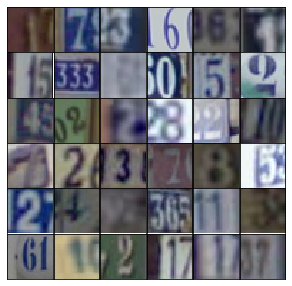

In [6]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. 
First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. 
We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [7]:
# Scale works the same as tanh
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [8]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [9]:
def model_inputs(real_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')    
    return inputs_real

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [10]:
def generator(x, output_dim, reuse=False, alpha=0.1, training=True, trainable=False):
    with tf.variable_scope('generator', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=x, filters=64, kernel_size=5, strides=2, padding='same', 
                              trainable=trainable)
        # 16x16x64
        h2 = tf.layers.conv2d(inputs=h1, filters=128, kernel_size=5, strides=2, padding='same', 
                              trainable=trainable)
        # 8x8x128
        h3 = tf.layers.conv2d(inputs=h2, filters=256, kernel_size=5, strides=2, padding='same', 
                              trainable=trainable)
        # 4x4x256

        # Flatten it
        h3_vec = tf.reshape(h3, (-1, 4*4*256))
        h4 = tf.layers.dense(h3_vec, 4*4*512, trainable=trainable)
        z = tf.reshape(h4, (-1, 4, 4, 512))
        # 4x4x512 now
        
        h5 = tf.layers.conv2d_transpose(inputs=z, filters=256, kernel_size=5, strides=2, padding='same')
        bn5 = tf.layers.batch_normalization(h5, training=training)
        nl5 = tf.maximum(alpha * bn5, bn5)
        # 8x8x256 now
        
        h6 = tf.layers.conv2d_transpose(inputs=nl5, filters=128, kernel_size=5, strides=2, padding='same')
        bn6 = tf.layers.batch_normalization(h6, training=training)
        nl6 = tf.maximum(alpha * bn6, bn6)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(inputs=nl6, filters=output_dim, kernel_size=5, strides=2, 
                                            padding='same')        
        predictions = tf.tanh(logits)
        # 32x32x3 now
        return predictions

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [11]:
def discriminator(x, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=x, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, 1)
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [14]:
def model_loss(inputs_real, output_dim, alpha=0.1):
    """
    Get the loss for the discriminator and generator
    :param inputs_real: Images from the real dataset
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (generator loss, discriminators losses)
    """
    inputs_fake = generator(x=inputs_real, output_dim=output_dim, alpha=alpha)
    Q = discriminator(x=inputs_real, alpha=alpha)
    q = discriminator(x=inputs_fake, alpha=alpha, reuse=True)
    dloss = tf.reduce_mean(Q-q) 
    gloss = -tf.reduce_mean(Q-q)
    return gloss, dloss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [15]:
def model_opt(g_loss, d_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param g_loss: Generator loss Tensor: one
    :param d_loss: Discriminators' loss Tensors: multiple
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (generator training operation, discriminators training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    
    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        
    return g_opt, d_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [16]:
class GAN:
    def __init__(self, real_size, learning_rate, alpha=0.2, beta1=0.5):
        self.input_real = model_inputs(real_dim=real_size)
        
        self.g_loss, self.d_loss = model_loss(inputs_real=self.input_real, output_dim=real_size[2], alpha=alpha)
        
        self.g_opt, self.d_opt = model_opt(g_loss=self.g_loss, d_loss=self.d_loss, 
                                           learning_rate=learning_rate, beta1=beta1)

Here is a function for displaying generated images.

In [17]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [18]:
def train(net, dataset, epochs, batch_size, print_every=20, show_every=200, figsize=(5,5)):
    saver = tf.train.Saver()
    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):

                # Run optimizers
                dloss, _ = sess.run([net.d_loss, net.d_opt], feed_dict={net.input_real: x})
                gloss, _ = sess.run([net.g_loss, net.g_opt], feed_dict={net.input_real: x})

                steps += 1
                if steps % print_every == 0:
                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Dloss: {:.4f}".format(dloss),
                          "Gloss: {:.4f}".format(gloss))
                    # Save losses to view after training
                    losses.append([dloss, gloss])

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(x=net.input_real, output_dim=3, reuse=True, training=False),
                                   feed_dict={net.input_real: x})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

#         saver.save(sess, './checkpoints/generator.ckpt')
#         with open('samples.pkl', 'wb') as f:
#             pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [19]:
real_size = (32,32,3)
learning_rate = 0.0002
batch_size = 128
epochs = 200
alpha = 0.2
beta1 = 0.5

tf.reset_default_graph()

# Create the network
net = GAN(real_size=real_size, learning_rate=learning_rate, alpha=alpha, beta1=beta1)

dataset = Dataset(trainset, testset)

Epoch 1/200... Dloss: -8.8216 Gloss: 16.2052
Epoch 1/200... Dloss: -11.1317 Gloss: 20.1982
Epoch 1/200... Dloss: -13.4403 Gloss: 22.3900
Epoch 1/200... Dloss: -25.2176 Gloss: 37.2416
Epoch 1/200... Dloss: -52.8121 Gloss: 70.8765
Epoch 1/200... Dloss: -94.4428 Gloss: 113.5943
Epoch 1/200... Dloss: -116.3078 Gloss: 133.2452
Epoch 1/200... Dloss: -185.2953 Gloss: 191.7922
Epoch 1/200... Dloss: -115.8136 Gloss: 39.0161
Epoch 1/200... Dloss: -201.7651 Gloss: 221.5457


/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1334: MatplotlibDeprecationWarning: 
box-forced
  "2.2", "box-forced", obj_type="keyword argument")


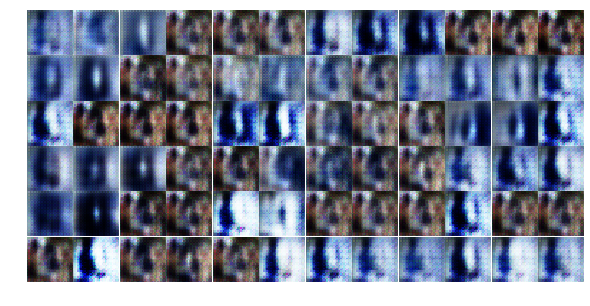

Epoch 1/200... Dloss: -183.0255 Gloss: 171.6304
Epoch 1/200... Dloss: -296.2233 Gloss: 301.3930
Epoch 1/200... Dloss: -265.2983 Gloss: 254.8458
Epoch 1/200... Dloss: -316.5181 Gloss: 320.6110
Epoch 1/200... Dloss: -377.1882 Gloss: 384.2608
Epoch 1/200... Dloss: -415.7742 Gloss: 421.5657
Epoch 1/200... Dloss: -454.9221 Gloss: 459.5520
Epoch 1/200... Dloss: -378.2336 Gloss: 423.2858
Epoch 1/200... Dloss: -522.8589 Gloss: 527.5082
Epoch 1/200... Dloss: -572.8766 Gloss: 576.4591


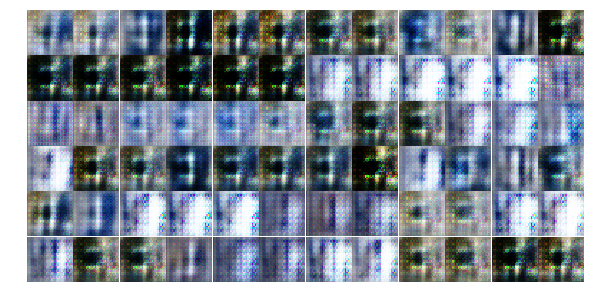

Epoch 1/200... Dloss: -384.0096 Gloss: 459.5005
Epoch 1/200... Dloss: -593.3398 Gloss: 616.1605
Epoch 1/200... Dloss: -642.9963 Gloss: 659.6885
Epoch 1/200... Dloss: -707.9713 Gloss: 711.3767
Epoch 1/200... Dloss: -750.5308 Gloss: 753.8749
Epoch 1/200... Dloss: -791.0951 Gloss: 794.8927
Epoch 1/200... Dloss: -721.7383 Gloss: 705.4196
Epoch 1/200... Dloss: -855.9608 Gloss: 860.4595
Epoch 2/200... Dloss: -798.7531 Gloss: 431.6678
Epoch 2/200... Dloss: -944.4543 Gloss: 947.7731


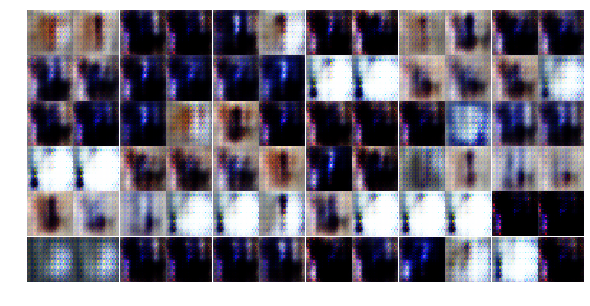

Epoch 2/200... Dloss: -993.6358 Gloss: 996.3343
Epoch 2/200... Dloss: -1038.7802 Gloss: 1041.5701
Epoch 2/200... Dloss: -1081.8223 Gloss: 1084.6971
Epoch 2/200... Dloss: -1123.1891 Gloss: 1126.4265
Epoch 2/200... Dloss: -1169.3976 Gloss: 1173.0111
Epoch 2/200... Dloss: -1214.9199 Gloss: 1218.3219
Epoch 2/200... Dloss: -1261.2856 Gloss: 1264.7327
Epoch 2/200... Dloss: -1295.3196 Gloss: 1299.9045
Epoch 2/200... Dloss: -591.7915 Gloss: 993.0165
Epoch 2/200... Dloss: -1199.3816 Gloss: 1027.9059


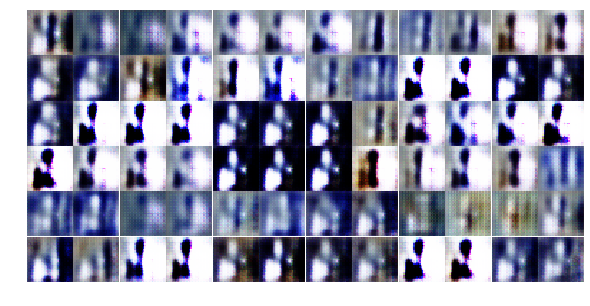

Epoch 2/200... Dloss: -1032.4443 Gloss: 179.9686
Epoch 2/200... Dloss: -1411.1306 Gloss: 1415.9714
Epoch 2/200... Dloss: -1433.3020 Gloss: 1445.3563
Epoch 2/200... Dloss: -1442.0190 Gloss: 1468.0927
Epoch 2/200... Dloss: -1552.1458 Gloss: 1557.3405
Epoch 2/200... Dloss: -1593.4012 Gloss: 1600.9104
Epoch 2/200... Dloss: -1354.8630 Gloss: 1509.7397
Epoch 2/200... Dloss: -1653.6702 Gloss: 1665.7090
Epoch 2/200... Dloss: -1733.1333 Gloss: 1737.7224
Epoch 2/200... Dloss: -1798.1104 Gloss: 1802.1306


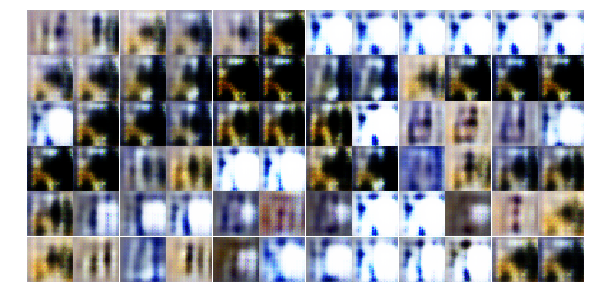

Epoch 2/200... Dloss: -1843.9773 Gloss: 1848.2407
Epoch 2/200... Dloss: -1863.1211 Gloss: 1874.1034
Epoch 2/200... Dloss: -1806.4976 Gloss: 1829.6907
Epoch 2/200... Dloss: -1985.5068 Gloss: 1990.8170
Epoch 2/200... Dloss: -2044.9031 Gloss: 2049.6133
Epoch 2/200... Dloss: -2017.4606 Gloss: 2032.7322
Epoch 2/200... Dloss: -2133.5466 Gloss: 2140.2590
Epoch 3/200... Dloss: -2175.9302 Gloss: 2186.0974
Epoch 3/200... Dloss: -2258.6704 Gloss: 2263.6924
Epoch 3/200... Dloss: -2325.0554 Gloss: 2328.8040


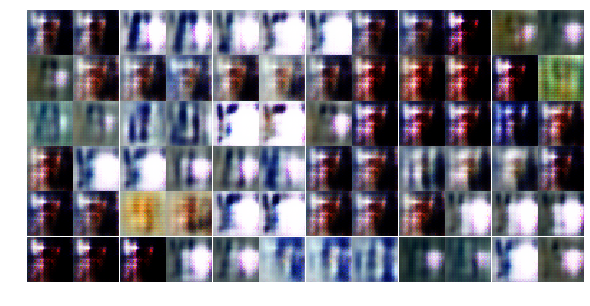

Epoch 3/200... Dloss: -2393.4290 Gloss: 2396.9653
Epoch 3/200... Dloss: -2449.4302 Gloss: 2452.8945
Epoch 3/200... Dloss: -2508.8921 Gloss: 2512.5488
Epoch 3/200... Dloss: -2560.8164 Gloss: 2565.5093
Epoch 3/200... Dloss: -2615.8594 Gloss: 2620.5779
Epoch 3/200... Dloss: -2669.1331 Gloss: 2674.5781
Epoch 3/200... Dloss: -399.5438 Gloss: 1605.6632
Epoch 3/200... Dloss: -2051.8193 Gloss: 2237.8545
Epoch 3/200... Dloss: -1491.5593 Gloss: 2235.7671
Epoch 3/200... Dloss: -2564.3655 Gloss: 2574.5674


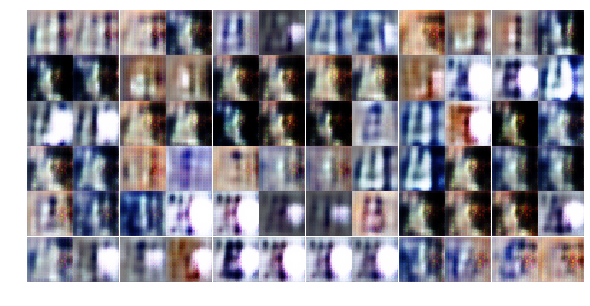

Epoch 3/200... Dloss: -2794.6567 Gloss: 2812.7585
Epoch 3/200... Dloss: -1914.5881 Gloss: 2676.6204
Epoch 3/200... Dloss: -2676.3674 Gloss: 2760.8193
Epoch 3/200... Dloss: -313.2225 Gloss: 527.9256
Epoch 3/200... Dloss: -3011.3313 Gloss: 3019.7756
Epoch 3/200... Dloss: -3038.5591 Gloss: 3053.4348
Epoch 3/200... Dloss: -2973.6621 Gloss: 3021.4250
Epoch 3/200... Dloss: -3233.4558 Gloss: 3238.7852
Epoch 3/200... Dloss: -3308.2495 Gloss: 3313.4092
Epoch 3/200... Dloss: -3385.0059 Gloss: 3389.3384


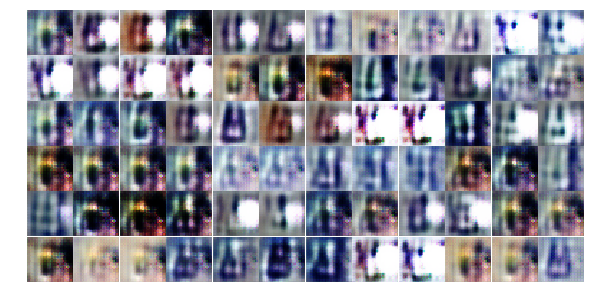

Epoch 3/200... Dloss: -3450.8306 Gloss: 3455.5144
Epoch 3/200... Dloss: -3518.8623 Gloss: 3523.2876
Epoch 3/200... Dloss: -3585.8647 Gloss: 3590.2280
Epoch 3/200... Dloss: -3643.8574 Gloss: 3650.3083
Epoch 3/200... Dloss: -3327.8992 Gloss: 3285.0293
Epoch 4/200... Dloss: -2636.8914 Gloss: 3255.3818
Epoch 4/200... Dloss: -2490.3340 Gloss: 3025.5508
Epoch 4/200... Dloss: -2408.7881 Gloss: 2705.1426
Epoch 4/200... Dloss: -3786.9521 Gloss: 3811.7302
Epoch 4/200... Dloss: -3365.3330 Gloss: 2639.0947


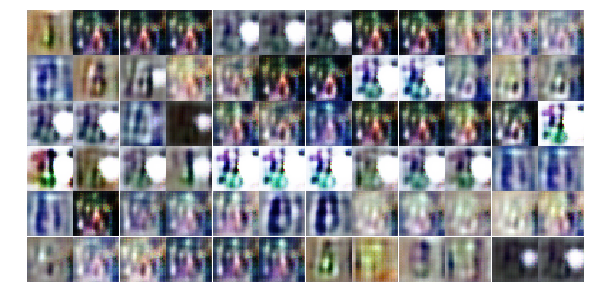

Epoch 4/200... Dloss: -4016.2009 Gloss: 4022.5139
Epoch 4/200... Dloss: -4070.9517 Gloss: 4077.7319
Epoch 4/200... Dloss: -4180.3306 Gloss: 4185.5166
Epoch 4/200... Dloss: -4236.2803 Gloss: 4242.4736
Epoch 4/200... Dloss: -4330.9023 Gloss: 4335.9727
Epoch 4/200... Dloss: -4404.8496 Gloss: 4410.4082
Epoch 4/200... Dloss: -4472.8701 Gloss: 4478.2412
Epoch 4/200... Dloss: -4536.7622 Gloss: 4543.4473
Epoch 4/200... Dloss: -4502.2266 Gloss: 4534.5562
Epoch 4/200... Dloss: -4654.2158 Gloss: 4663.8184


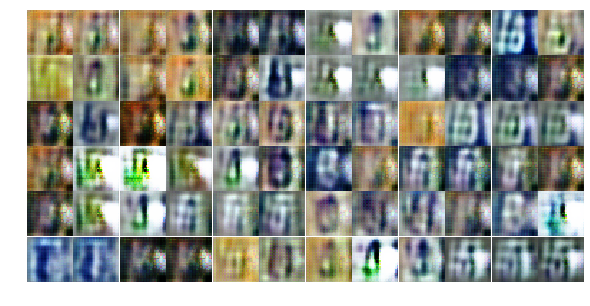

Epoch 4/200... Dloss: -3803.2690 Gloss: 2864.3145
Epoch 4/200... Dloss: -4816.9570 Gloss: 4824.0137
Epoch 4/200... Dloss: -4887.1187 Gloss: 4894.0054
Epoch 4/200... Dloss: -4986.3013 Gloss: 4993.8809
Epoch 4/200... Dloss: -5056.1748 Gloss: 5064.0933
Epoch 4/200... Dloss: -5137.7744 Gloss: 5143.8237
Epoch 4/200... Dloss: -5228.7832 Gloss: 5234.6787
Epoch 4/200... Dloss: -5308.7500 Gloss: 5314.9482
Epoch 4/200... Dloss: -5381.0493 Gloss: 5387.0303
Epoch 4/200... Dloss: -5459.4629 Gloss: 5466.2373


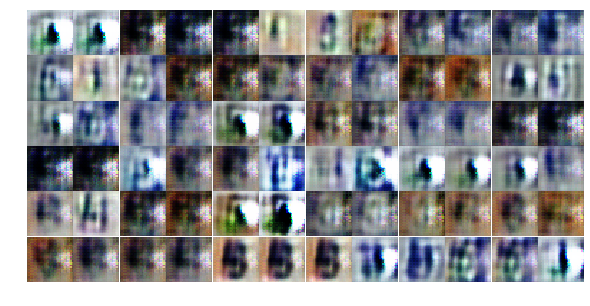

Epoch 4/200... Dloss: -5486.2783 Gloss: 5499.9854
Epoch 4/200... Dloss: -4469.3564 Gloss: 4688.4326
Epoch 4/200... Dloss: -5629.9556 Gloss: 5639.7012
Epoch 4/200... Dloss: -5716.5581 Gloss: 5725.6953
Epoch 5/200... Dloss: -2063.7319 Gloss: 2321.9385
Epoch 5/200... Dloss: -4682.6558 Gloss: 4727.5024
Epoch 5/200... Dloss: -5594.0581 Gloss: 5780.6899
Epoch 5/200... Dloss: -5947.8945 Gloss: 5966.5820
Epoch 5/200... Dloss: -1355.9771 Gloss: 3890.4031
Epoch 5/200... Dloss: -4946.0728 Gloss: 2982.6265


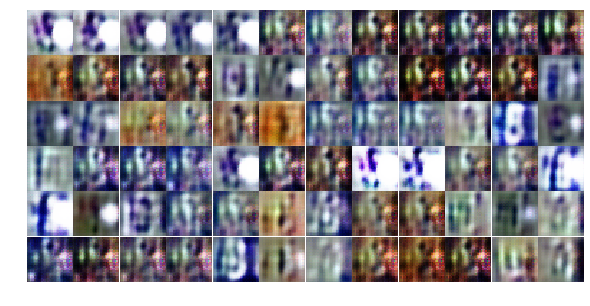

Epoch 5/200... Dloss: -1971.5398 Gloss: 3472.9307
Epoch 5/200... Dloss: -5606.6924 Gloss: 5777.7827
Epoch 5/200... Dloss: -5571.5576 Gloss: 5496.1646
Epoch 5/200... Dloss: -5499.7944 Gloss: 5798.4238
Epoch 5/200... Dloss: -5504.1709 Gloss: 5777.9302
Epoch 5/200... Dloss: -6533.5625 Gloss: 6540.4053
Epoch 5/200... Dloss: -6629.7979 Gloss: 6635.9771
Epoch 5/200... Dloss: -6706.5654 Gloss: 6713.6406
Epoch 5/200... Dloss: -6605.7910 Gloss: 6657.1558
Epoch 5/200... Dloss: -2511.0879 Gloss: 3837.6023


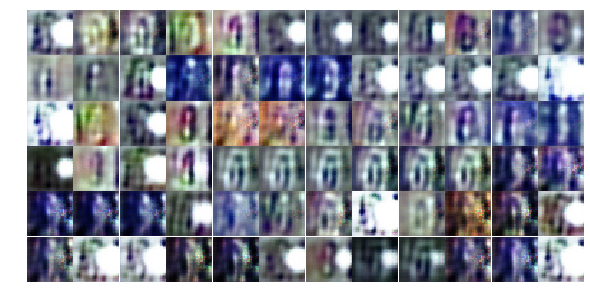

Epoch 5/200... Dloss: -6021.1562 Gloss: 6176.7637
Epoch 5/200... Dloss: -6666.5864 Gloss: 6733.5352
Epoch 5/200... Dloss: -6945.7056 Gloss: 6961.3613
Epoch 5/200... Dloss: -7082.4043 Gloss: 7091.8867
Epoch 5/200... Dloss: -7197.6045 Gloss: 7205.9180
Epoch 5/200... Dloss: -7269.0752 Gloss: 7282.0605
Epoch 5/200... Dloss: -7081.9209 Gloss: 7142.3633
Epoch 5/200... Dloss: -5355.6211 Gloss: 5307.6533
Epoch 5/200... Dloss: -4500.4697 Gloss: 6605.7925
Epoch 5/200... Dloss: -6731.1294 Gloss: 7103.0991


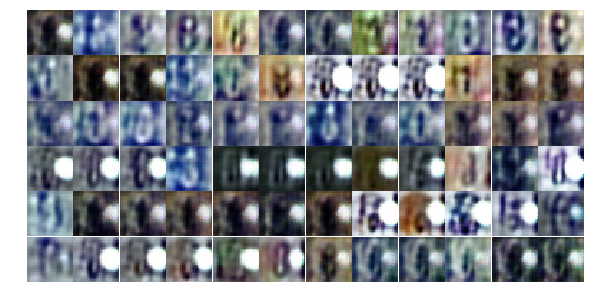

Epoch 5/200... Dloss: -7167.6377 Gloss: 7325.9619
Epoch 5/200... Dloss: -6381.9185 Gloss: 5711.2104
Epoch 5/200... Dloss: -7215.4521 Gloss: 7380.0088
Epoch 6/200... Dloss: -7841.8423 Gloss: 7851.2920
Epoch 6/200... Dloss: -7952.9976 Gloss: 7960.5474
Epoch 6/200... Dloss: -7253.7139 Gloss: 7831.7983
Epoch 6/200... Dloss: -7639.7080 Gloss: 7688.0229
Epoch 6/200... Dloss: -3769.3086 Gloss: 5616.0352
Epoch 6/200... Dloss: -4997.5488 Gloss: 5810.0049
Epoch 6/200... Dloss: -3980.6260 Gloss: 5255.5078


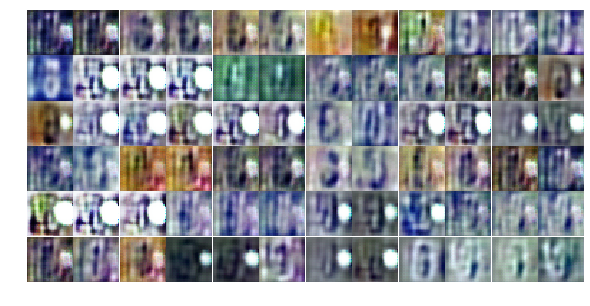

Epoch 6/200... Dloss: -7326.7632 Gloss: 7509.1270
Epoch 6/200... Dloss: -7268.1172 Gloss: 7770.5371
Epoch 6/200... Dloss: -6022.1646 Gloss: 6709.9966
Epoch 6/200... Dloss: -5346.8018 Gloss: 6686.7256
Epoch 6/200... Dloss: -4448.3164 Gloss: 4917.2876
Epoch 6/200... Dloss: -1004.8230 Gloss: 1536.4517
Epoch 6/200... Dloss: -8597.0234 Gloss: 8613.5928
Epoch 6/200... Dloss: -8766.9141 Gloss: 8779.4180
Epoch 6/200... Dloss: -8708.1055 Gloss: 8729.5098
Epoch 6/200... Dloss: -7381.3325 Gloss: 7619.1895


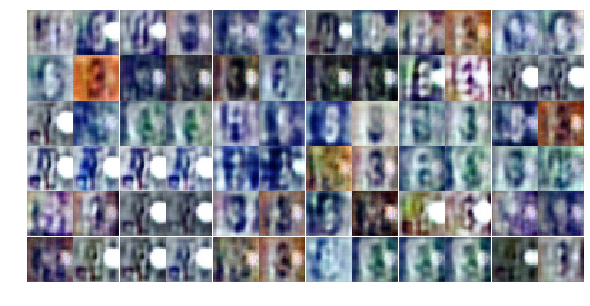

Epoch 6/200... Dloss: -6914.8457 Gloss: 7325.6899
Epoch 6/200... Dloss: -4876.5879 Gloss: 5925.4106
Epoch 6/200... Dloss: -7497.3706 Gloss: 8283.2920
Epoch 6/200... Dloss: -5414.5640 Gloss: 6881.7915
Epoch 6/200... Dloss: -9164.4756 Gloss: 9192.2559
Epoch 6/200... Dloss: -7490.0161 Gloss: 7649.3003
Epoch 6/200... Dloss: -9137.6172 Gloss: 9200.0049
Epoch 6/200... Dloss: -6572.7998 Gloss: 6396.9170
Epoch 6/200... Dloss: -8018.1582 Gloss: 9080.4082
Epoch 6/200... Dloss: -9703.1934 Gloss: 9717.0000


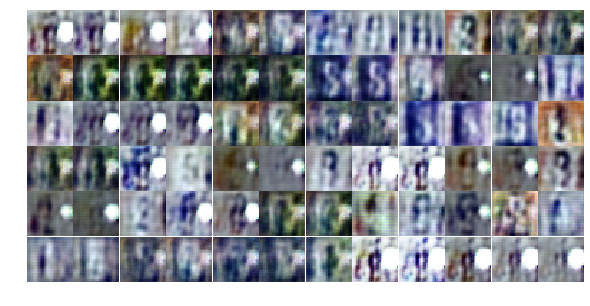

Epoch 6/200... Dloss: -5398.9644 Gloss: 3623.2563
Epoch 7/200... Dloss: -6508.6606 Gloss: 7344.6948
Epoch 7/200... Dloss: -5917.7539 Gloss: 6495.5605
Epoch 7/200... Dloss: -6120.9082 Gloss: 7604.9521
Epoch 7/200... Dloss: -8713.3203 Gloss: 8970.9365
Epoch 7/200... Dloss: -6820.5801 Gloss: 4160.6519
Epoch 7/200... Dloss: -8840.3428 Gloss: 9245.5000
Epoch 7/200... Dloss: -8723.4033 Gloss: 9223.4277
Epoch 7/200... Dloss: -8720.0352 Gloss: 9134.5039
Epoch 7/200... Dloss: -1295.3588 Gloss: 1982.9469


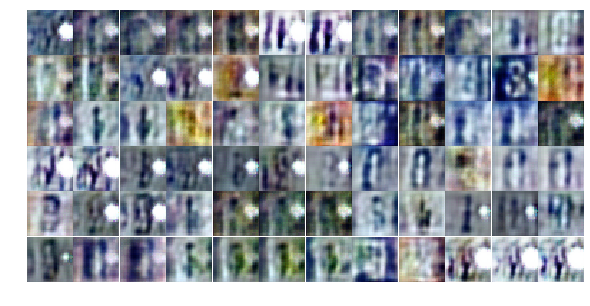

Epoch 7/200... Dloss: -9050.8301 Gloss: 9533.7285
Epoch 7/200... Dloss: -8531.4941 Gloss: 8997.4150
Epoch 7/200... Dloss: -6927.7949 Gloss: 6728.1406
Epoch 7/200... Dloss: -9347.3652 Gloss: 9824.7285
Epoch 7/200... Dloss: -5714.3071 Gloss: 7951.8701
Epoch 7/200... Dloss: -10494.3438 Gloss: 10538.2627
Epoch 7/200... Dloss: -4735.6479 Gloss: 7776.6147
Epoch 7/200... Dloss: -7156.5391 Gloss: 6760.0557
Epoch 7/200... Dloss: -10672.5527 Gloss: 10851.1230
Epoch 7/200... Dloss: -11255.7793 Gloss: 11268.6582


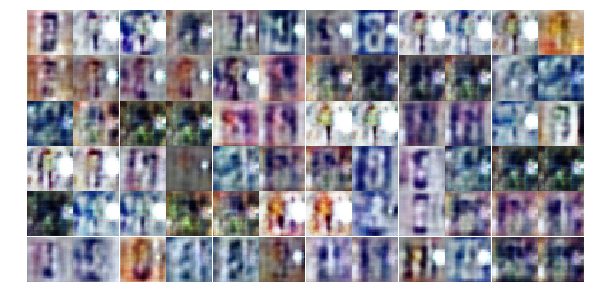

Epoch 7/200... Dloss: -11435.0127 Gloss: 11444.4805
Epoch 7/200... Dloss: -11576.8535 Gloss: 11585.2881
Epoch 7/200... Dloss: -11702.9238 Gloss: 11712.7832
Epoch 7/200... Dloss: -11822.4756 Gloss: 11831.0527
Epoch 7/200... Dloss: -11944.4688 Gloss: 11953.5762
Epoch 7/200... Dloss: -12012.1406 Gloss: 12024.3652
Epoch 7/200... Dloss: -11602.5537 Gloss: 11766.4297
Epoch 7/200... Dloss: -7424.1855 Gloss: 9269.5352
Epoch 7/200... Dloss: -4538.3423 Gloss: 8478.3203
Epoch 7/200... Dloss: -8423.9590 Gloss: 8583.7803


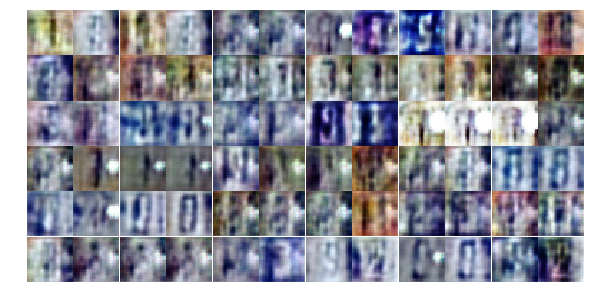

Epoch 8/200... Dloss: -9709.4375 Gloss: 10962.1680
Epoch 8/200... Dloss: -12417.1172 Gloss: 12435.7480
Epoch 8/200... Dloss: -10759.6582 Gloss: 11429.0576
Epoch 8/200... Dloss: -8457.4961 Gloss: 9661.7266
Epoch 8/200... Dloss: -9985.2871 Gloss: 10952.0879
Epoch 8/200... Dloss: -12461.8535 Gloss: 12575.8145
Epoch 8/200... Dloss: -12834.3994 Gloss: 12865.5234
Epoch 8/200... Dloss: -13143.8086 Gloss: 13154.2480
Epoch 8/200... Dloss: -13199.8457 Gloss: 13213.2969
Epoch 8/200... Dloss: -9827.2129 Gloss: 5152.5732


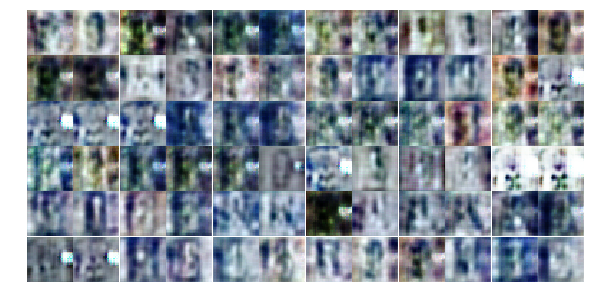

Epoch 8/200... Dloss: -9549.1953 Gloss: 10396.6387
Epoch 8/200... Dloss: -3748.0239 Gloss: 7065.9043
Epoch 8/200... Dloss: -7176.0327 Gloss: 8271.7773
Epoch 8/200... Dloss: -11701.3984 Gloss: 12345.4082
Epoch 8/200... Dloss: -10955.6553 Gloss: 11107.0449
Epoch 8/200... Dloss: -10292.1016 Gloss: 11411.4502
Epoch 8/200... Dloss: -12633.1035 Gloss: 12543.3711
Epoch 8/200... Dloss: -3190.1653 Gloss: 8273.0000
Epoch 8/200... Dloss: -6948.5771 Gloss: 11452.8340
Epoch 8/200... Dloss: -10358.9814 Gloss: 9749.1309


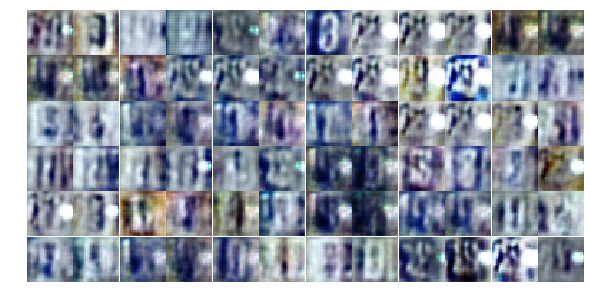

Epoch 8/200... Dloss: -13890.9629 Gloss: 13962.4990
Epoch 8/200... Dloss: -10024.6494 Gloss: 8272.4854
Epoch 8/200... Dloss: -13093.3154 Gloss: 13296.2197
Epoch 8/200... Dloss: -9727.6914 Gloss: 10355.2012
Epoch 8/200... Dloss: -9049.1104 Gloss: 13321.8320
Epoch 8/200... Dloss: -12427.0312 Gloss: 12778.6553
Epoch 8/200... Dloss: -9218.8789 Gloss: 9638.9795
Epoch 8/200... Dloss: -14777.9014 Gloss: 14798.4541
Epoch 8/200... Dloss: -13118.5986 Gloss: 14020.0107
Epoch 9/200... Dloss: -15021.8984 Gloss: 15053.4932


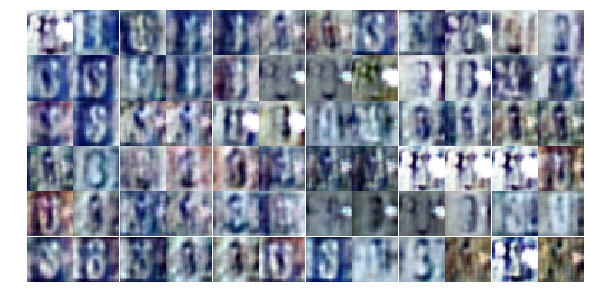

Epoch 9/200... Dloss: -12370.0723 Gloss: 12687.3652
Epoch 9/200... Dloss: -14643.0020 Gloss: 14898.1865
Epoch 9/200... Dloss: -15296.1797 Gloss: 15333.7168
Epoch 9/200... Dloss: -2016.9794 Gloss: 3161.3657
Epoch 9/200... Dloss: -12522.0312 Gloss: 12800.2314
Epoch 9/200... Dloss: -6575.1519 Gloss: 9670.4111
Epoch 9/200... Dloss: -6908.9736 Gloss: 11152.5840
Epoch 9/200... Dloss: -6659.0850 Gloss: 10930.6875
Epoch 9/200... Dloss: -13058.9990 Gloss: 13424.0342
Epoch 9/200... Dloss: -11191.5039 Gloss: 11622.2012


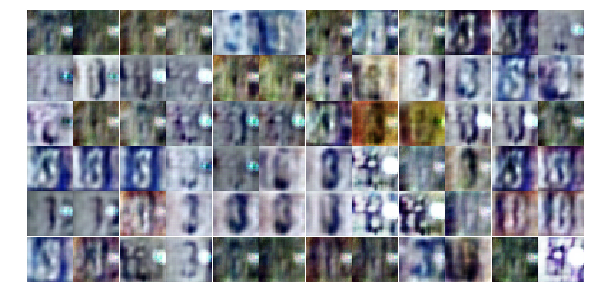

Epoch 9/200... Dloss: -9884.1953 Gloss: 12369.3926
Epoch 9/200... Dloss: -13483.9766 Gloss: 14246.5596
Epoch 9/200... Dloss: -6492.1074 Gloss: 12015.6953
Epoch 9/200... Dloss: -6984.7700 Gloss: 11350.8330
Epoch 9/200... Dloss: -16032.9863 Gloss: 16083.6797
Epoch 9/200... Dloss: -15874.4375 Gloss: 16098.9082
Epoch 9/200... Dloss: -16227.6631 Gloss: 16329.1592
Epoch 9/200... Dloss: -16926.1328 Gloss: 16944.2695
Epoch 9/200... Dloss: -17041.4746 Gloss: 17057.7891
Epoch 9/200... Dloss: -17272.4727 Gloss: 17285.6875


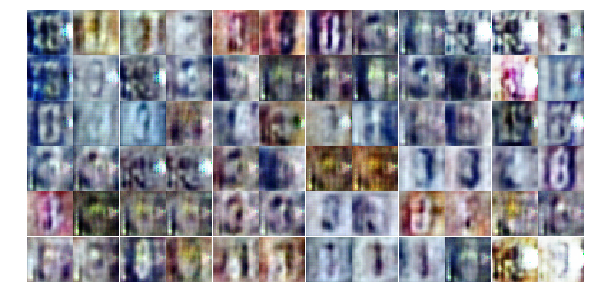

Epoch 9/200... Dloss: -17466.2383 Gloss: 17477.9355
Epoch 9/200... Dloss: -17573.3008 Gloss: 17585.3359
Epoch 9/200... Dloss: -17448.3125 Gloss: 17500.7539
Epoch 9/200... Dloss: -5879.0527 Gloss: 13196.2588
Epoch 9/200... Dloss: -13316.9570 Gloss: 11079.1914
Epoch 9/200... Dloss: -7609.9556 Gloss: 10995.4414
Epoch 9/200... Dloss: -7760.3818 Gloss: 12547.9629
Epoch 10/200... Dloss: -18107.2227 Gloss: 18128.1855
Epoch 10/200... Dloss: -18209.3926 Gloss: 18230.3945
Epoch 10/200... Dloss: -18420.4902 Gloss: 18437.0332


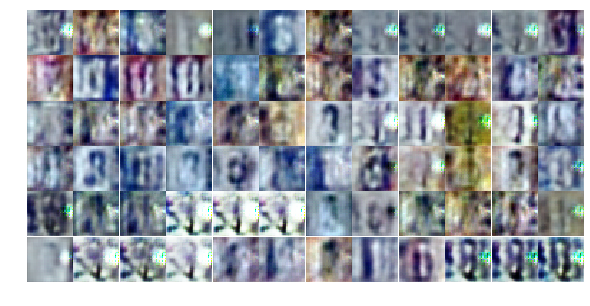

Epoch 10/200... Dloss: -18620.1406 Gloss: 18632.5703
Epoch 10/200... Dloss: -18757.9883 Gloss: 18772.6641
Epoch 10/200... Dloss: -18965.8320 Gloss: 18976.9922
Epoch 10/200... Dloss: -19031.8984 Gloss: 19046.2988
Epoch 10/200... Dloss: -18746.0762 Gloss: 18785.4863
Epoch 10/200... Dloss: -9577.8789 Gloss: 3399.6353
Epoch 10/200... Dloss: -19256.4590 Gloss: 19284.8301
Epoch 10/200... Dloss: -18971.2656 Gloss: 19027.8047
Epoch 10/200... Dloss: -19457.8125 Gloss: 19501.8906
Epoch 10/200... Dloss: -15645.7285 Gloss: 15011.2393


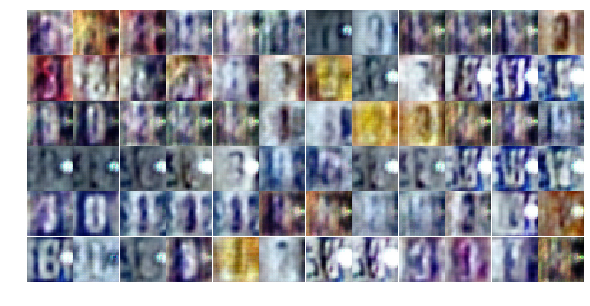

Epoch 10/200... Dloss: -12409.5137 Gloss: 12539.2822
Epoch 10/200... Dloss: -19931.1543 Gloss: 19957.2852
Epoch 10/200... Dloss: -20171.5527 Gloss: 20185.5703
Epoch 10/200... Dloss: -20318.2910 Gloss: 20332.4785
Epoch 10/200... Dloss: -20544.5703 Gloss: 20556.5430
Epoch 10/200... Dloss: -20665.8633 Gloss: 20677.0039
Epoch 10/200... Dloss: -20747.1641 Gloss: 20761.6973
Epoch 10/200... Dloss: -20845.6289 Gloss: 20865.8555
Epoch 10/200... Dloss: -19794.0859 Gloss: 20003.2168
Epoch 10/200... Dloss: -11745.3086 Gloss: 6603.5303


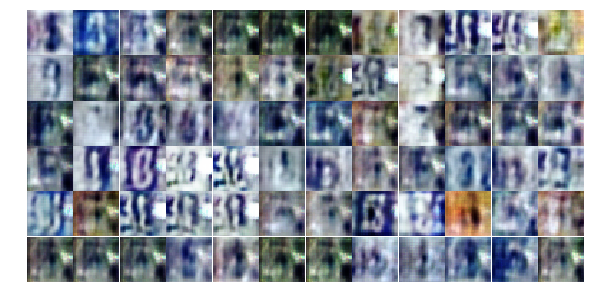

Epoch 10/200... Dloss: -6258.7163 Gloss: 15102.8643
Epoch 10/200... Dloss: -19738.5000 Gloss: 19882.9062
Epoch 10/200... Dloss: -19255.7070 Gloss: 19818.8164
Epoch 10/200... Dloss: -9743.7129 Gloss: 16860.0117
Epoch 10/200... Dloss: -18355.0723 Gloss: 19433.2188
Epoch 10/200... Dloss: -21603.3984 Gloss: 21624.5469
Epoch 11/200... Dloss: -21909.0137 Gloss: 21922.2051
Epoch 11/200... Dloss: -22080.8047 Gloss: 22091.8711
Epoch 11/200... Dloss: -22126.8438 Gloss: 22144.7773
Epoch 11/200... Dloss: -22404.4414 Gloss: 22415.3477


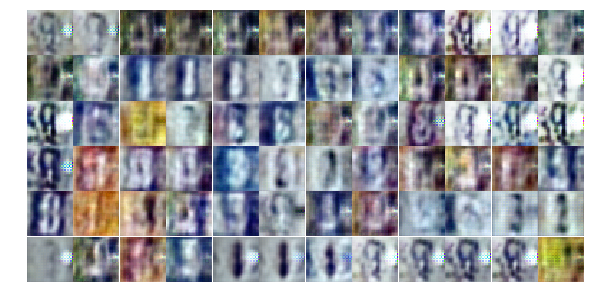

Epoch 11/200... Dloss: -22549.3438 Gloss: 22559.5430
Epoch 11/200... Dloss: -22722.3516 Gloss: 22733.8867
Epoch 11/200... Dloss: -22848.4590 Gloss: 22859.6289
Epoch 11/200... Dloss: -22798.4766 Gloss: 22816.8125
Epoch 11/200... Dloss: -21762.2930 Gloss: 22379.8477
Epoch 11/200... Dloss: -18721.2422 Gloss: 20641.8398
Epoch 11/200... Dloss: -22129.1094 Gloss: 22330.5898
Epoch 11/200... Dloss: -22260.3672 Gloss: 22221.5664
Epoch 11/200... Dloss: -23492.8809 Gloss: 23508.6523
Epoch 11/200... Dloss: -23732.0410 Gloss: 23744.7852


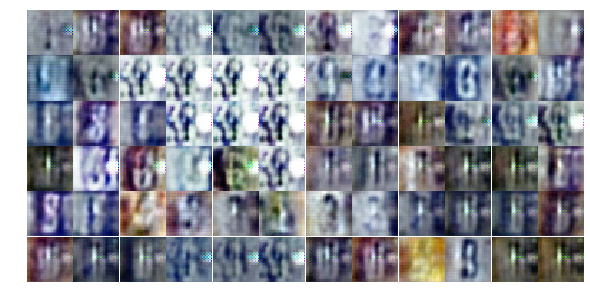

Epoch 11/200... Dloss: -23862.7012 Gloss: 23874.2910
Epoch 11/200... Dloss: -24056.0566 Gloss: 24066.8867
Epoch 11/200... Dloss: -24209.3848 Gloss: 24221.4336
Epoch 11/200... Dloss: -24341.1680 Gloss: 24352.7969
Epoch 11/200... Dloss: -24489.6406 Gloss: 24500.9180
Epoch 11/200... Dloss: -24600.5859 Gloss: 24613.2930
Epoch 11/200... Dloss: -24701.4570 Gloss: 24718.1641
Epoch 11/200... Dloss: -24770.8359 Gloss: 24791.3164
Epoch 11/200... Dloss: -24585.9746 Gloss: 24667.9102
Epoch 11/200... Dloss: -24977.6641 Gloss: 25007.0117


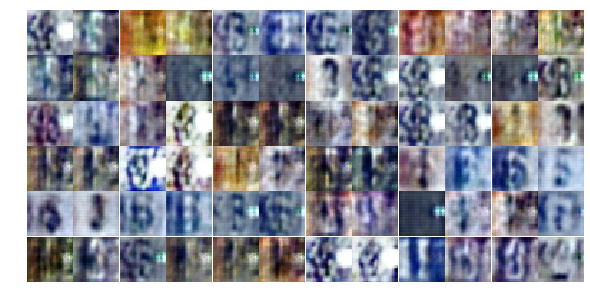

Epoch 11/200... Dloss: -817.2142 Gloss: 1070.5332
Epoch 11/200... Dloss: -16036.4873 Gloss: 17709.4785
Epoch 11/200... Dloss: -19446.3926 Gloss: 19867.3281
Epoch 11/200... Dloss: -19793.6445 Gloss: 22268.5723
Epoch 11/200... Dloss: -18490.8750 Gloss: 18950.1250
Epoch 12/200... Dloss: -20816.6250 Gloss: 23021.2461
Epoch 12/200... Dloss: -15391.4443 Gloss: 16115.2441
Epoch 12/200... Dloss: -20349.9375 Gloss: 21509.6758
Epoch 12/200... Dloss: -19832.7031 Gloss: 21416.2344
Epoch 12/200... Dloss: -24145.2305 Gloss: 23723.6777


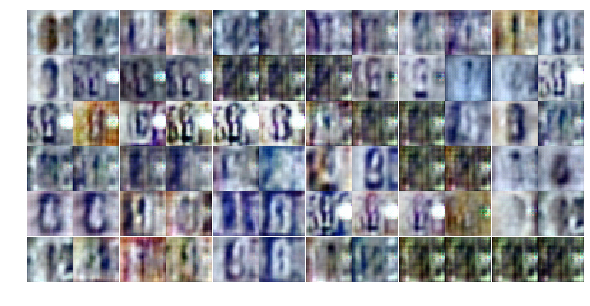

Epoch 12/200... Dloss: -24484.2422 Gloss: 24737.8145
Epoch 12/200... Dloss: -25625.1328 Gloss: 25816.0078
Epoch 12/200... Dloss: -25853.5605 Gloss: 26061.1973
Epoch 12/200... Dloss: -19747.6504 Gloss: 20690.0039
Epoch 12/200... Dloss: -24512.2930 Gloss: 24894.4629
Epoch 12/200... Dloss: -24301.9121 Gloss: 24784.8516
Epoch 12/200... Dloss: -12660.4346 Gloss: 20085.6719
Epoch 12/200... Dloss: -17845.4570 Gloss: 18820.1367
Epoch 12/200... Dloss: -25269.7324 Gloss: 26096.4180
Epoch 12/200... Dloss: -27220.7051 Gloss: 27242.1230


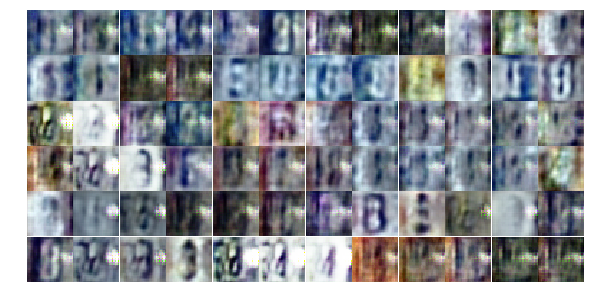

Epoch 12/200... Dloss: -27412.9355 Gloss: 27428.8008
Epoch 12/200... Dloss: -27540.7051 Gloss: 27562.0098
Epoch 12/200... Dloss: -21489.3613 Gloss: 22115.5957
Epoch 12/200... Dloss: -26982.4551 Gloss: 27177.5898
Epoch 12/200... Dloss: -27741.2539 Gloss: 27774.0020
Epoch 12/200... Dloss: -27842.4453 Gloss: 27889.2168
Epoch 12/200... Dloss: -27244.7949 Gloss: 27361.5273
Epoch 12/200... Dloss: -27597.2637 Gloss: 27821.4531
Epoch 12/200... Dloss: -16999.3750 Gloss: 17277.6387
Epoch 12/200... Dloss: -28211.2930 Gloss: 28281.9688


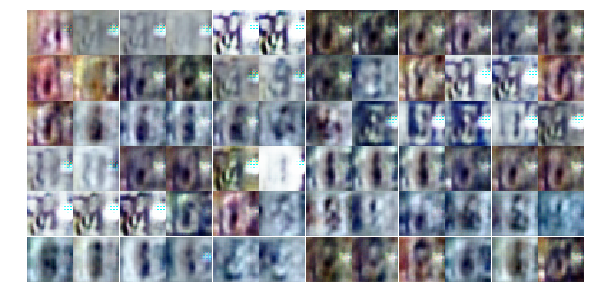

Epoch 12/200... Dloss: -26606.6406 Gloss: 27501.9805
Epoch 12/200... Dloss: -28792.6211 Gloss: 28822.2656
Epoch 12/200... Dloss: -26323.8672 Gloss: 27442.1270
Epoch 13/200... Dloss: -7712.3042 Gloss: 10802.1914
Epoch 13/200... Dloss: -17181.7363 Gloss: 17913.4961
Epoch 13/200... Dloss: -21231.8086 Gloss: 16564.0234
Epoch 13/200... Dloss: -23304.9102 Gloss: 15976.8906
Epoch 13/200... Dloss: -775.0615 Gloss: 1043.8406
Epoch 13/200... Dloss: -28719.8672 Gloss: 29045.1406
Epoch 13/200... Dloss: -29743.6523 Gloss: 29764.0508


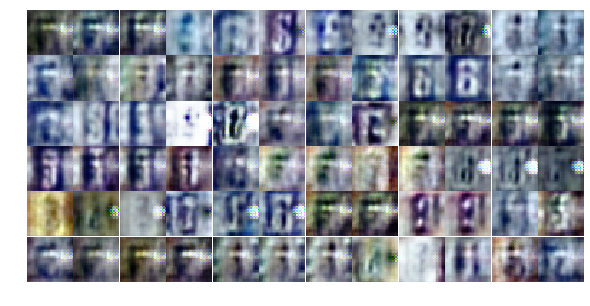

Epoch 13/200... Dloss: -29857.1113 Gloss: 29885.5195
Epoch 13/200... Dloss: -16603.7266 Gloss: 21723.5703
Epoch 13/200... Dloss: -25017.3047 Gloss: 26705.0723
Epoch 13/200... Dloss: -27801.2617 Gloss: 29022.8633
Epoch 13/200... Dloss: -24146.7305 Gloss: 27436.5586
Epoch 13/200... Dloss: -20704.1406 Gloss: 21184.4160
Epoch 13/200... Dloss: -21819.1680 Gloss: 17593.1895
Epoch 13/200... Dloss: -27899.7109 Gloss: 27920.7754
Epoch 13/200... Dloss: -30553.3008 Gloss: 30586.3301
Epoch 13/200... Dloss: -30855.7812 Gloss: 30880.6016


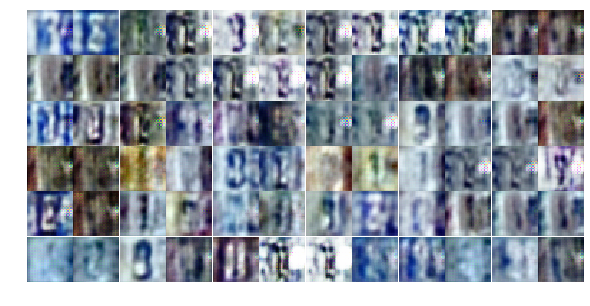

Epoch 13/200... Dloss: -30907.7891 Gloss: 30943.3359
Epoch 13/200... Dloss: -30567.4082 Gloss: 30684.7695
Epoch 13/200... Dloss: -15602.2744 Gloss: 22564.8906
Epoch 13/200... Dloss: -22780.7676 Gloss: 26362.4082
Epoch 13/200... Dloss: -22962.5820 Gloss: 25531.9629
Epoch 13/200... Dloss: -15940.9863 Gloss: 19058.6699
Epoch 13/200... Dloss: -27853.5879 Gloss: 28965.2246
Epoch 13/200... Dloss: -16451.8047 Gloss: 22031.6055
Epoch 13/200... Dloss: -18775.1523 Gloss: 27927.5488
Epoch 13/200... Dloss: -26643.9395 Gloss: 30653.7461


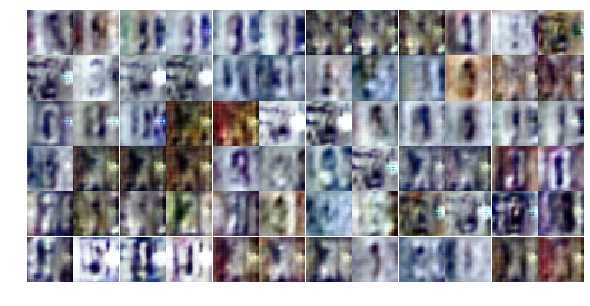

Epoch 13/200... Dloss: -32327.1484 Gloss: 32355.8555
Epoch 13/200... Dloss: -32708.0605 Gloss: 32723.9141
Epoch 14/200... Dloss: -32909.7812 Gloss: 32924.8867
Epoch 14/200... Dloss: -33153.7148 Gloss: 33168.8320
Epoch 14/200... Dloss: -33317.0781 Gloss: 33330.1016
Epoch 14/200... Dloss: -33480.8008 Gloss: 33496.7344
Epoch 14/200... Dloss: -33678.8984 Gloss: 33694.5547
Epoch 14/200... Dloss: -33559.8750 Gloss: 33591.3398
Epoch 14/200... Dloss: -33321.5664 Gloss: 33462.3281
Epoch 14/200... Dloss: -33160.6562 Gloss: 33318.7734


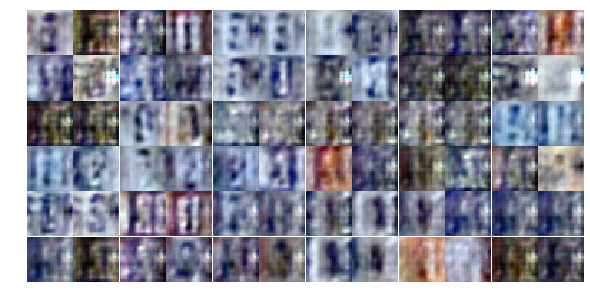

Epoch 14/200... Dloss: -29601.7090 Gloss: 32815.0000
Epoch 14/200... Dloss: -33917.2188 Gloss: 34015.8203
Epoch 14/200... Dloss: -33222.4961 Gloss: 33757.8984
Epoch 14/200... Dloss: -28589.7852 Gloss: 29913.2539
Epoch 14/200... Dloss: -34782.5586 Gloss: 34819.4922
Epoch 14/200... Dloss: -35054.7500 Gloss: 35072.7305
Epoch 14/200... Dloss: -35249.6836 Gloss: 35270.1562
Epoch 14/200... Dloss: -35460.2188 Gloss: 35477.0469
Epoch 14/200... Dloss: -35647.7852 Gloss: 35664.2383
Epoch 14/200... Dloss: -35878.3828 Gloss: 35895.7500


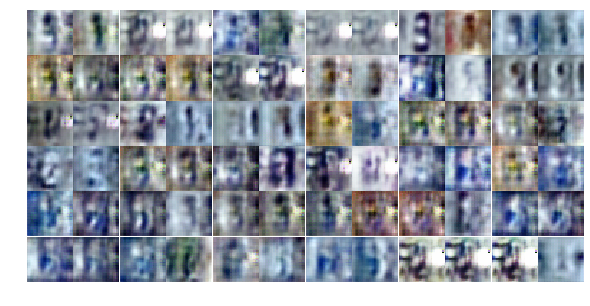

Epoch 14/200... Dloss: -36031.1484 Gloss: 36049.4844
Epoch 14/200... Dloss: -36032.3047 Gloss: 36060.4844
Epoch 14/200... Dloss: -36066.9141 Gloss: 36121.7461
Epoch 14/200... Dloss: -35717.8750 Gloss: 35827.6211
Epoch 14/200... Dloss: -24578.4531 Gloss: 30574.5430
Epoch 14/200... Dloss: -36902.2578 Gloss: 36924.4062
Epoch 14/200... Dloss: -37166.3906 Gloss: 37181.2344
Epoch 14/200... Dloss: -37362.2617 Gloss: 37377.4375
Epoch 14/200... Dloss: -37592.5391 Gloss: 37605.3047
Epoch 14/200... Dloss: -37785.9492 Gloss: 37800.2891


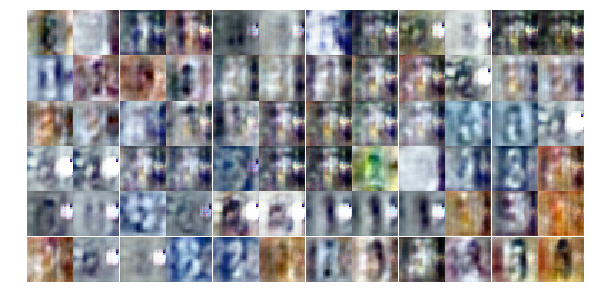

Epoch 14/200... Dloss: -37895.7266 Gloss: 37909.1797
Epoch 15/200... Dloss: -38073.8477 Gloss: 38086.3438
Epoch 15/200... Dloss: -38173.0820 Gloss: 38190.0117
Epoch 15/200... Dloss: -38415.7031 Gloss: 38430.8750
Epoch 15/200... Dloss: -36724.3789 Gloss: 37579.4609
Epoch 15/200... Dloss: -27106.5508 Gloss: 30062.3613
Epoch 15/200... Dloss: -38161.0625 Gloss: 38269.7539
Epoch 15/200... Dloss: -36601.4922 Gloss: 37320.5430
Epoch 15/200... Dloss: -38538.3203 Gloss: 38627.4883
Epoch 15/200... Dloss: -38798.7656 Gloss: 38858.4844


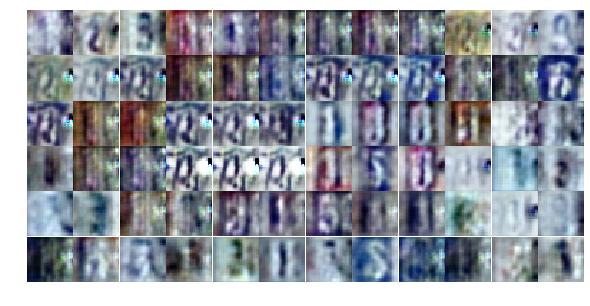

Epoch 15/200... Dloss: -37532.1172 Gloss: 38165.2617
Epoch 15/200... Dloss: -38935.0234 Gloss: 39049.0547
Epoch 15/200... Dloss: -39495.1641 Gloss: 39535.1641
Epoch 15/200... Dloss: -38440.8047 Gloss: 39041.4453
Epoch 15/200... Dloss: -39212.8477 Gloss: 39422.4805
Epoch 15/200... Dloss: -38505.3359 Gloss: 39063.6914
Epoch 15/200... Dloss: -39589.3203 Gloss: 39673.7812
Epoch 15/200... Dloss: -8833.9795 Gloss: 21062.2734
Epoch 15/200... Dloss: -40481.5039 Gloss: 40510.2617
Epoch 15/200... Dloss: -36402.9141 Gloss: 39543.4688


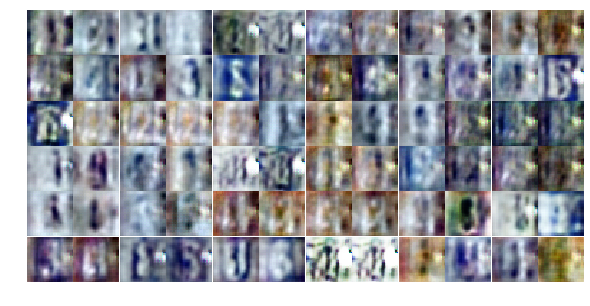

Epoch 15/200... Dloss: -702.5227 Gloss: 842.2294
Epoch 15/200... Dloss: -29258.6934 Gloss: 36538.7695
Epoch 15/200... Dloss: -38289.2617 Gloss: 38288.2578
Epoch 15/200... Dloss: -1432.5433 Gloss: 1852.8075
Epoch 15/200... Dloss: -17196.2344 Gloss: 10965.1777
Epoch 15/200... Dloss: -19624.3887 Gloss: 25804.8047
Epoch 15/200... Dloss: -28044.5000 Gloss: 34727.2422
Epoch 15/200... Dloss: -26643.7871 Gloss: 20239.8672
Epoch 15/200... Dloss: -26560.2773 Gloss: 32869.4453
Epoch 16/200... Dloss: -21918.8633 Gloss: 32004.2891


In [ ]:
losses, samples = train(net=net, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

(5730, 7) (5730, 7) float32 float32


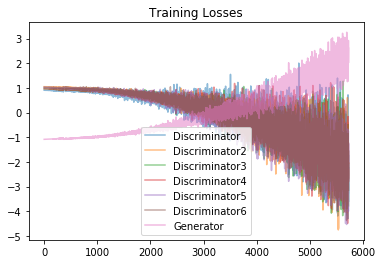

In [25]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
losses_norm = (losses_ - losses_.mean(axis=0))/losses_.std(axis=0)
print(losses_.shape, losses_norm.shape, losses_norm.dtype, losses_norm.dtype)
plt.plot(losses_norm.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses_norm.T[6], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

(5730, 7) (5730, 7) float32 float32


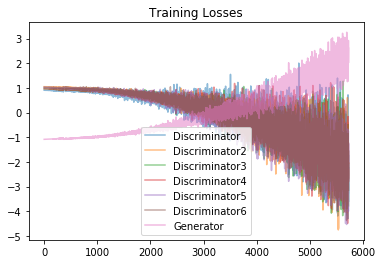

In [26]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
losses_norm = (losses_ - losses_.mean(axis=0))/losses_.std(axis=0)
print(losses_.shape, losses_norm.shape, losses_norm.dtype, losses_norm.dtype)
plt.plot(losses_norm.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses_norm.T[1], label='Discriminator2', alpha=0.5)
plt.plot(losses_norm.T[2], label='Discriminator3', alpha=0.5)
plt.plot(losses_norm.T[3], label='Discriminator4', alpha=0.5)
plt.plot(losses_norm.T[4], label='Discriminator5', alpha=0.5)
plt.plot(losses_norm.T[5], label='Discriminator6', alpha=0.5)
plt.plot(losses_norm.T[6], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

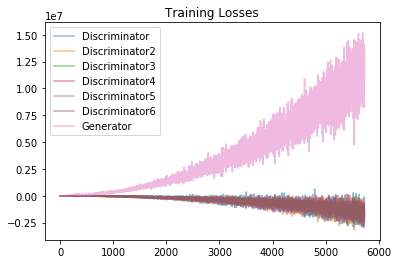

In [27]:
fig, ax = plt.subplots()
losses_norm = np.array(losses)
plt.plot(losses_norm.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses_norm.T[1], label='Discriminator2', alpha=0.5)
plt.plot(losses_norm.T[2], label='Discriminator3', alpha=0.5)
plt.plot(losses_norm.T[3], label='Discriminator4', alpha=0.5)
plt.plot(losses_norm.T[4], label='Discriminator5', alpha=0.5)
plt.plot(losses_norm.T[5], label='Discriminator6', alpha=0.5)
plt.plot(losses_norm.T[6], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

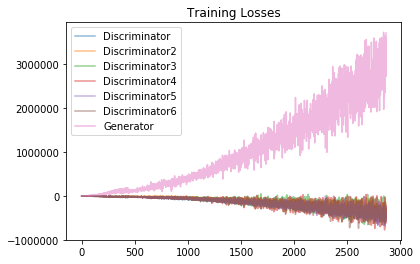

In [33]:
fig, ax = plt.subplots()
losses_norm = np.array(losses)
plt.plot(losses_norm.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses_norm.T[1], label='Discriminator2', alpha=0.5)
plt.plot(losses_norm.T[2], label='Discriminator3', alpha=0.5)
plt.plot(losses_norm.T[3], label='Discriminator4', alpha=0.5)
plt.plot(losses_norm.T[4], label='Discriminator5', alpha=0.5)
plt.plot(losses_norm.T[5], label='Discriminator6', alpha=0.5)
plt.plot(losses_norm.T[6], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

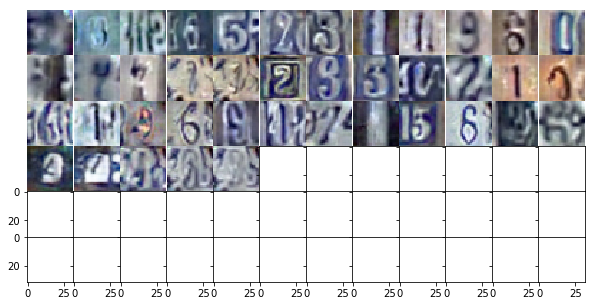

In [28]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

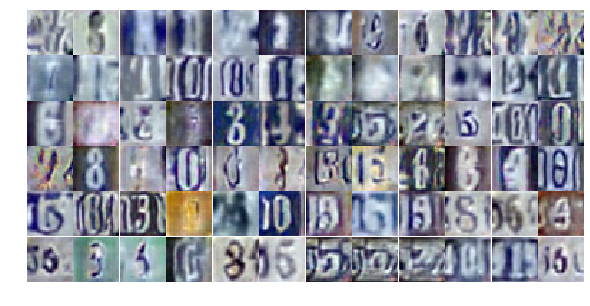

In [34]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

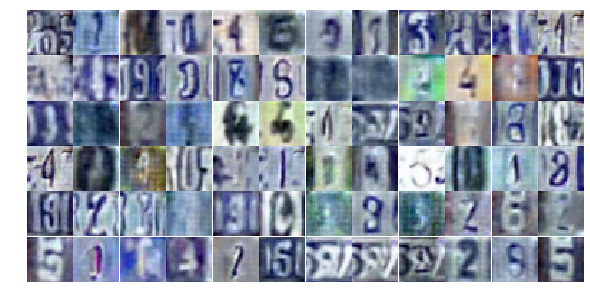

In [36]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

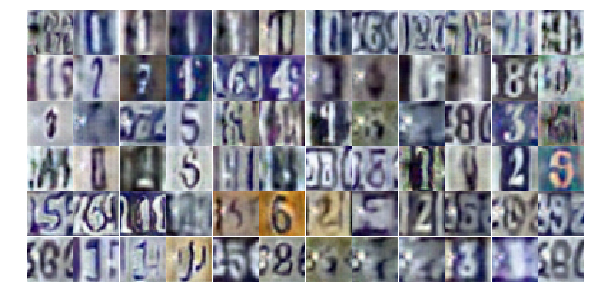

In [29]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

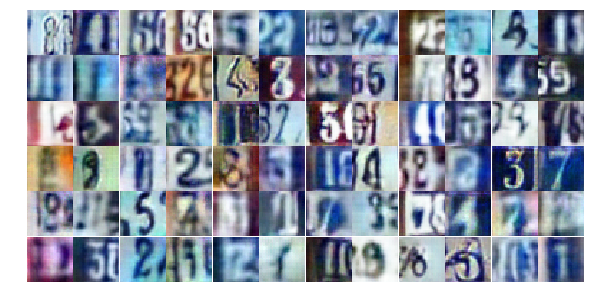

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))